In [1]:
import numpy as np
import json
import matplotlib.pyplot as plt
from easydict import EasyDict as edict

In [2]:
import mne
from mne.datasets import sample
from mne.time_frequency import csd_fourier, csd_multitaper, csd_morlet

In [3]:
import os

In [4]:
delta_t = 1500

In [5]:
import pickle

with open(f'20230203_data.pkl', 'rb') as f:
    data = pickle.load(f)
    dist_data = data['dist_data']
    dist_rec_field = data['dist_rec_field']
    turn_dist_data = data['turn_dist_data']
    turn_dist_rec_field = data['turn_dist_rec_field']
    speed_data = data['speed_data']
    speed_rec_field = data['speed_rec_field']
    neurons = data['neurons']


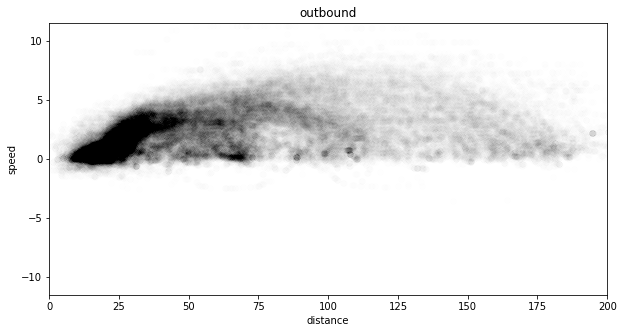

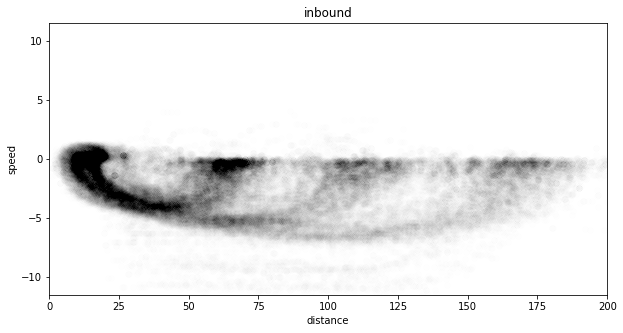

In [145]:
sessions = list(dist_data.keys())
sessions.sort()

for condition in ('outbound', 'inbound'):
    plt.figure(figsize=(10,5))
    for session in sessions:
        for i, neuron in enumerate(neurons[session]):
            try:
                plt.scatter(dist_rec_field[session][condition][neuron], speed_rec_field[session][condition][neuron], color='k', alpha=.005)
                plt.xlim(0,200)
                plt.ylim(-11.5, 11.5)
            except:
                pass
    plt.xlabel('distance')
    plt.ylabel('speed')
    plt.title(condition)


## Distance distribution

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:24: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


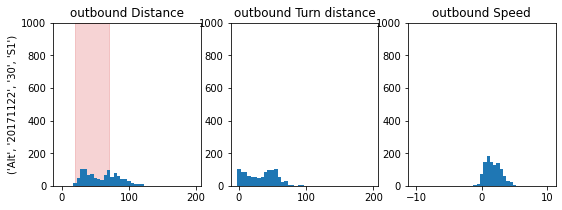

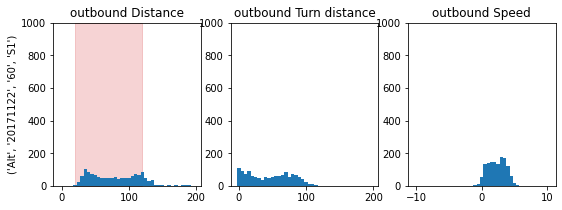

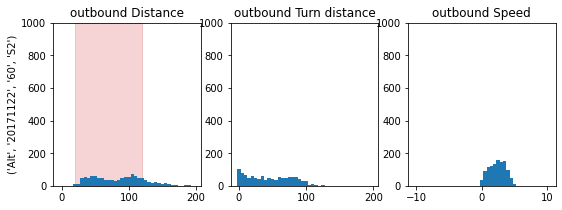

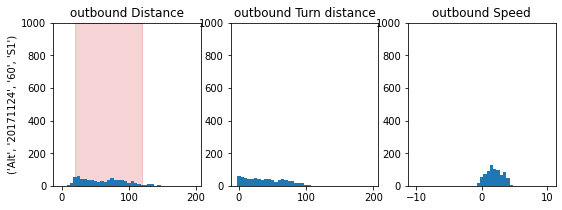

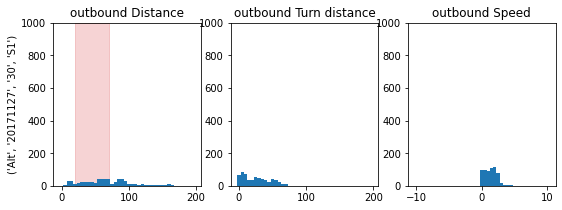

...

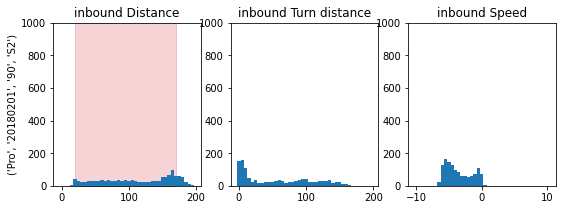

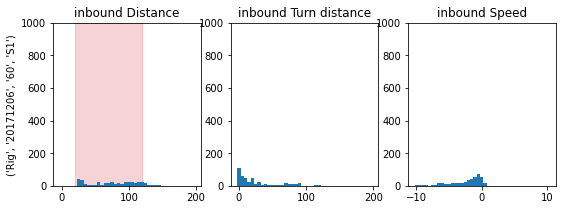

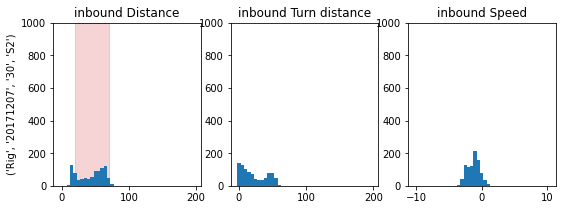

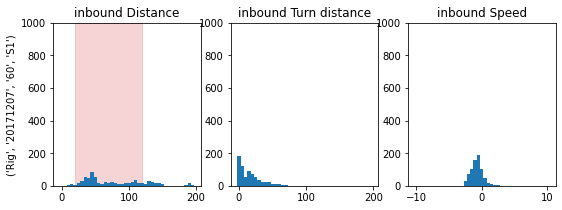

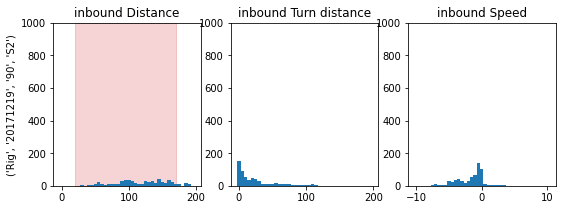

In [12]:
dist_hist = {}
speed_hist = {}
turn_dist_hist = {}

dist_min = 0
dist_max = 195
dist_n_bins = 40
dist_bin_interval = (dist_max - dist_min) / (dist_n_bins-1)
h_dist_min = dist_min - dist_bin_interval/2
h_dist_max = dist_max + dist_bin_interval/2

speed_min = -10
speed_max = 10
speed_n_bins = 41
speed_bin_interval =  (speed_max - speed_min) / (speed_n_bins-1)
h_speed_min = speed_min - speed_bin_interval/2
h_speed_max = speed_max + speed_bin_interval/2 

for condition in ('outbound', 'inbound'):
    dist_hist[condition] = {}
    speed_hist[condition] = {}
    turn_dist_hist[condition] = {}
    for session in sessions:
        plt.figure(figsize=(9,3))
        plt.subplot(1,3,1)
        if '90' in session:
            plt.fill_between([20, 170], [0, 0], [1000, 1000], color='tab:red', alpha = .2)  
        elif '60' in session:
            plt.fill_between([20, 120], [0, 0], [1000, 1000], color='tab:red', alpha = .2)  
        else:
            plt.fill_between([20, 70], [0, 0], [1000, 1000], color='tab:red', alpha = .2)  
        dist_hist[condition][session] = plt.hist(dist_data[session][condition], dist_n_bins, range=(h_dist_min,h_dist_max))
        plt.ylabel(session)
        plt.ylim(0,1000)
        plt.title(f'{condition} Distance')
        plt.subplot(1,3,2)
        turn_dist_hist[condition][session] = plt.hist(turn_dist_data[session][condition], dist_n_bins, range=(h_dist_min,h_dist_max))
        plt.ylim(0,1000)
        plt.title(f'{condition} Turn distance')
        plt.subplot(1,3,3)
        speed_hist[condition][session] = plt.hist(speed_data[session][condition], speed_n_bins, range=(h_speed_min,h_speed_max))
        plt.ylim(0,1000)
        plt.title(f'{condition} Speed')

# Distance receptive fields

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys


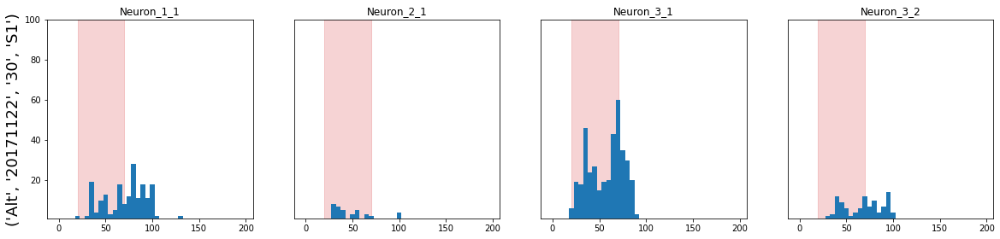

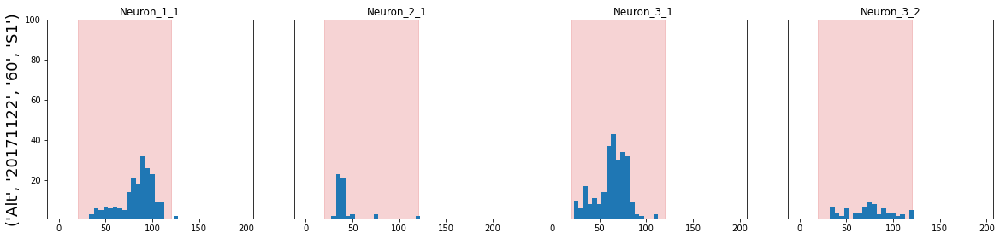

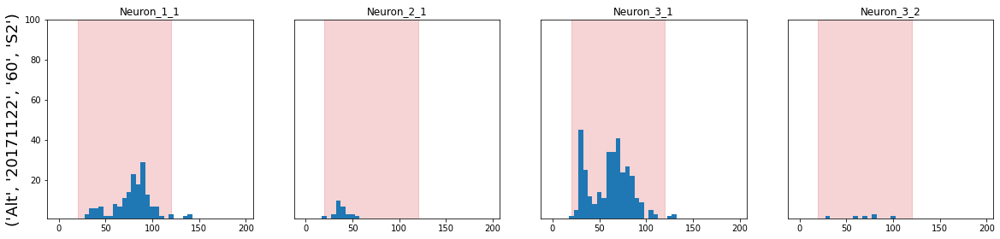

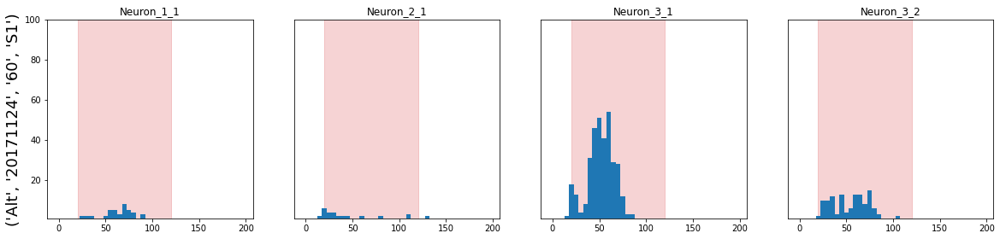

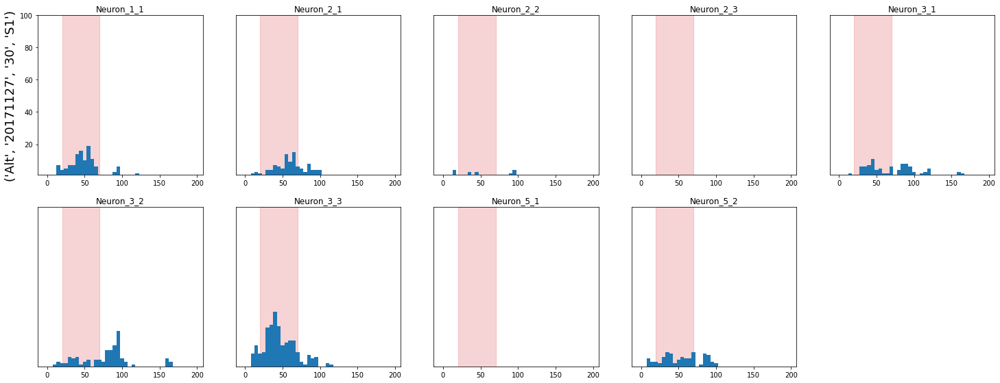

...

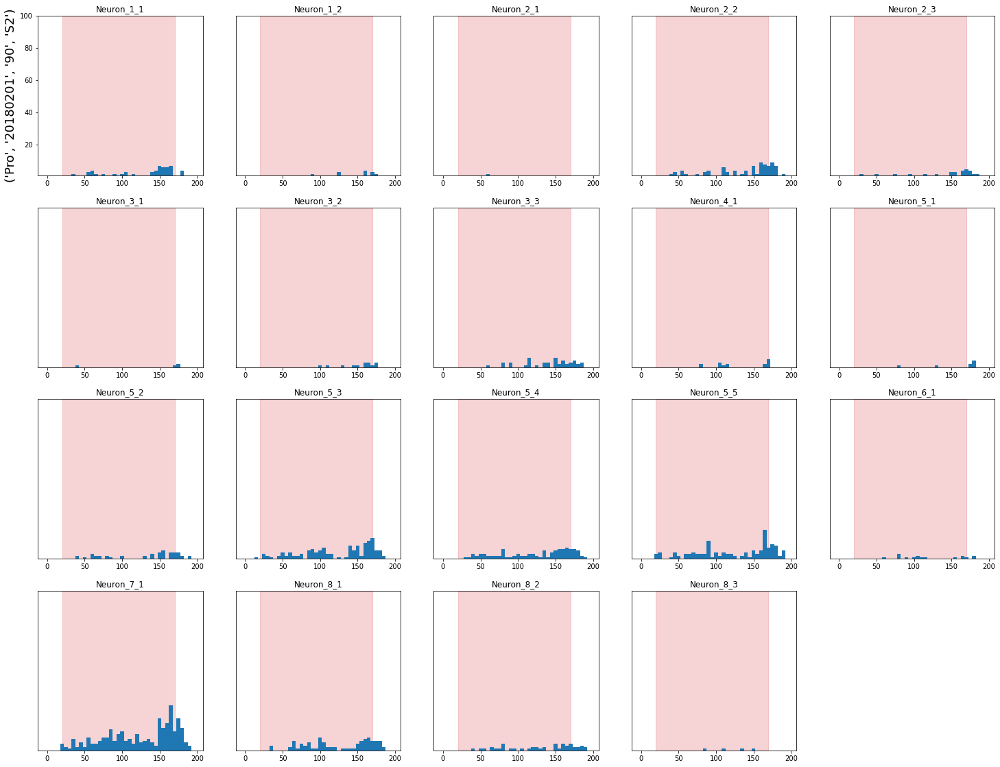

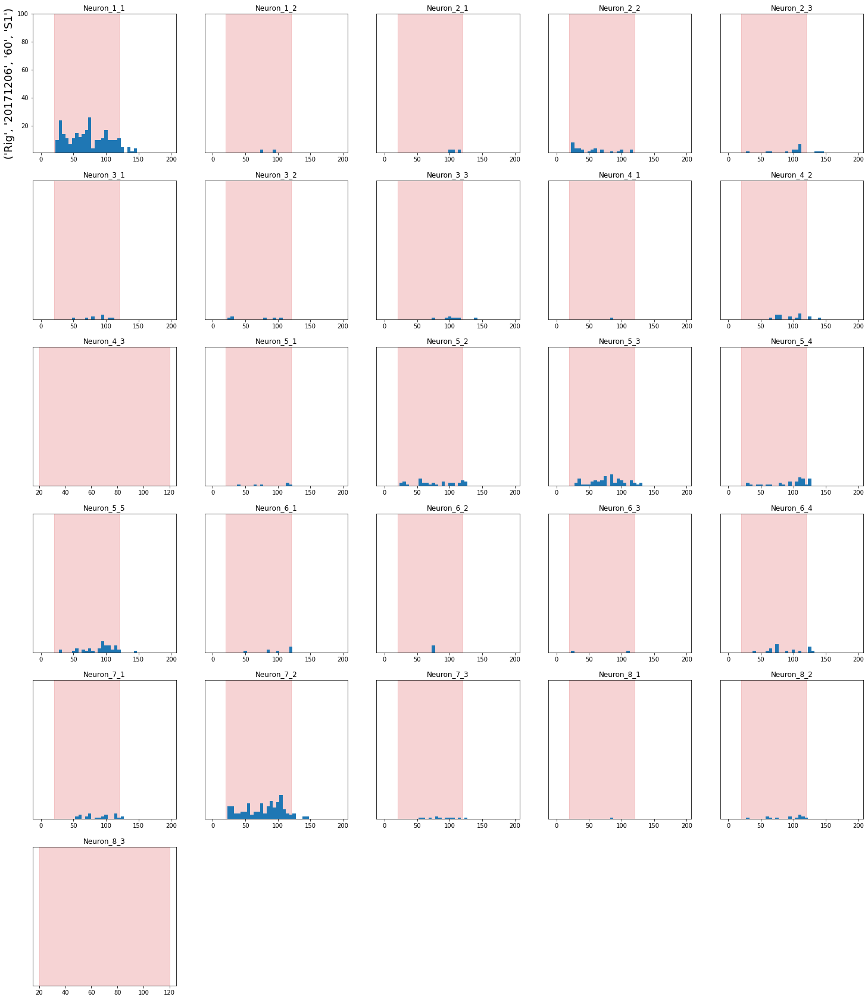

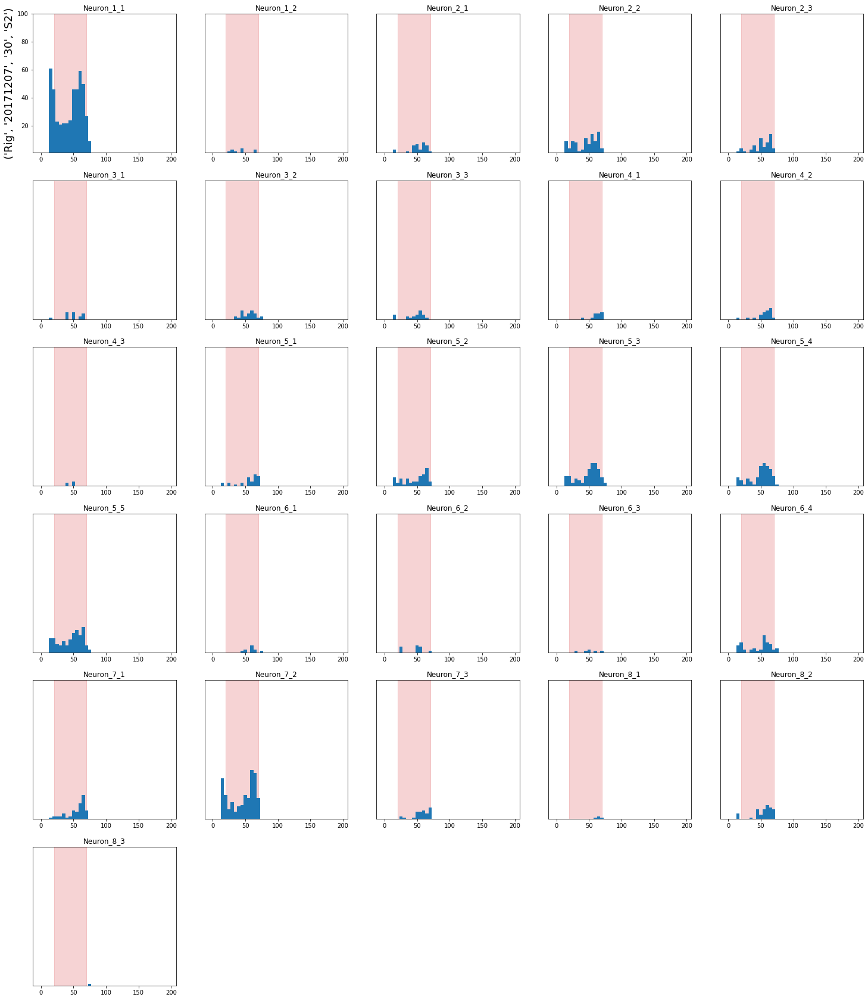

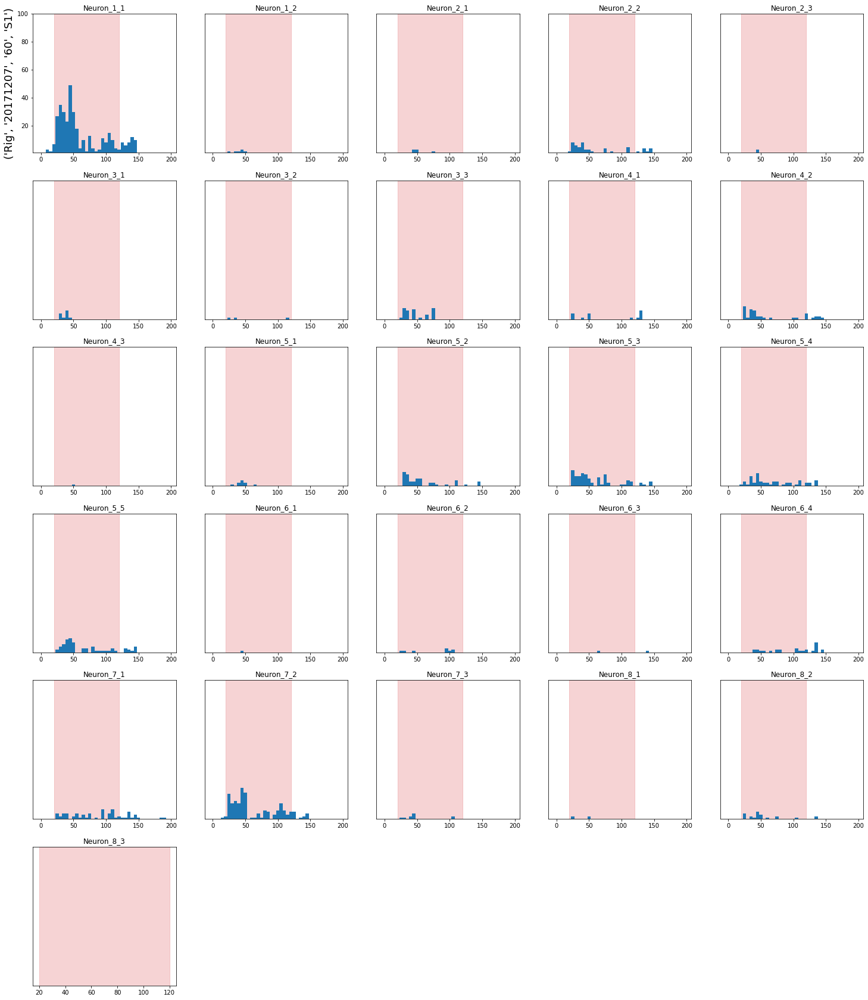

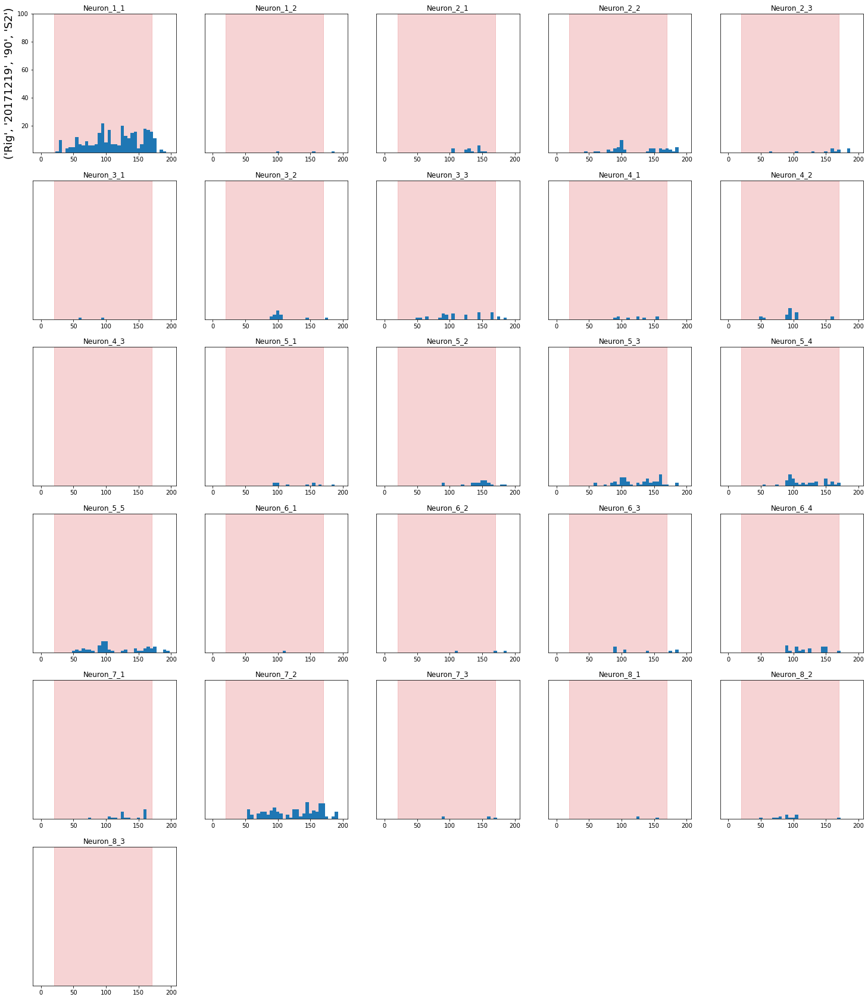

In [22]:
dist_field_hist = {}

for condition in ('outbound', 'inbound'):
    dist_field_hist[condition] = {}
    
    for session in sessions:
        plt.figure(figsize=(25,30))
        dist_field_hist[condition][session] = {}

        for i, neuron in enumerate(neurons[session]):
            plt.subplot(6,5,i+1)

            if '90' in session:
                plt.fill_between([20, 170], [0, 0], [1000, 1000], color='tab:red', alpha = .2)  
            elif '60' in session:
                plt.fill_between([20, 120], [0, 0], [1000, 1000], color='tab:red', alpha = .2)  
            else:
                plt.fill_between([20, 70], [0, 0], [1000, 1000], color='tab:red', alpha = .2)  

            try:
                dist_field_hist[condition][session][neuron] = plt.hist(dist_rec_field[session][condition][neuron], dist_n_bins, range=(h_dist_min,h_dist_max))
            except:
                pass
            plt.title(neuron)
            plt.ylim(1,100)
            #plt.xlim(-190,10)

            if i ==0:
                plt.ylabel(session, fontsize=18)
            else:
                plt.yticks([])
        

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until


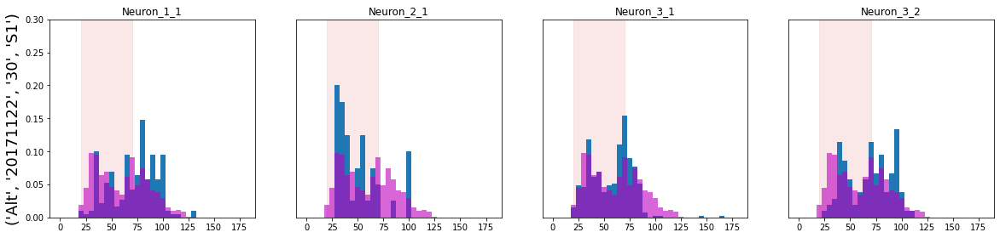

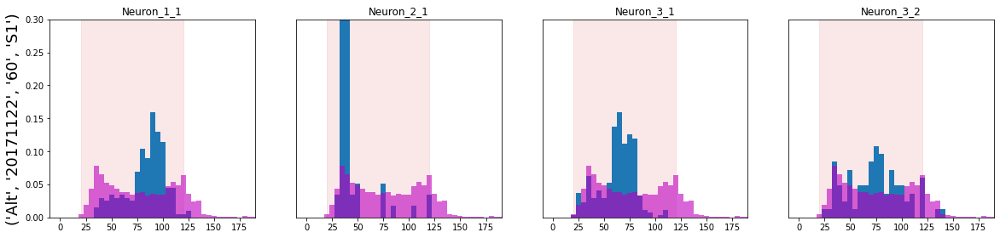

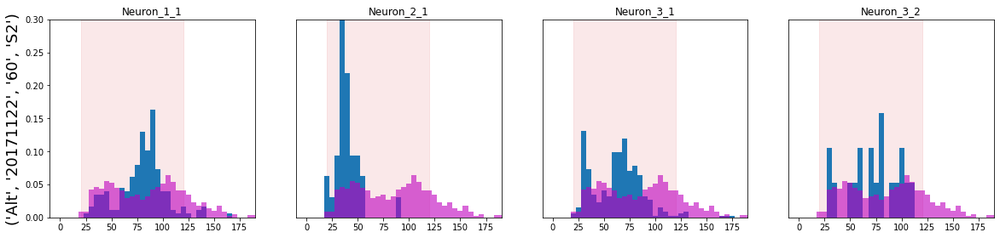

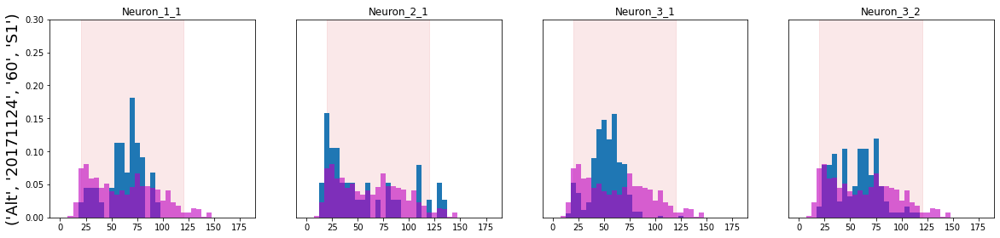

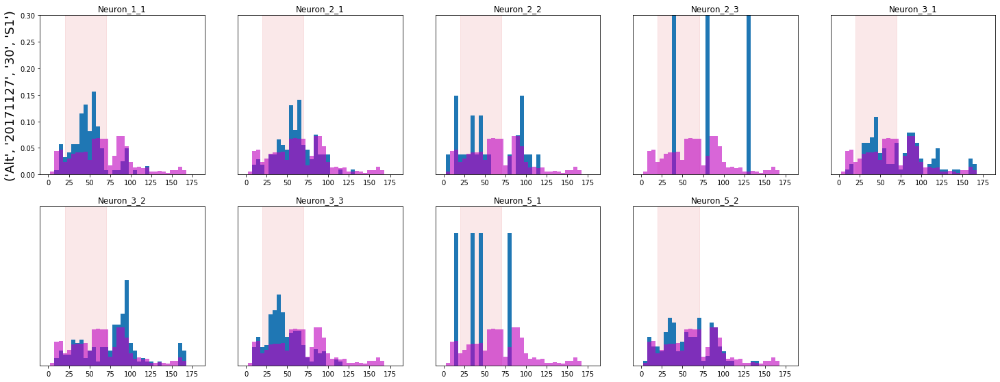

...

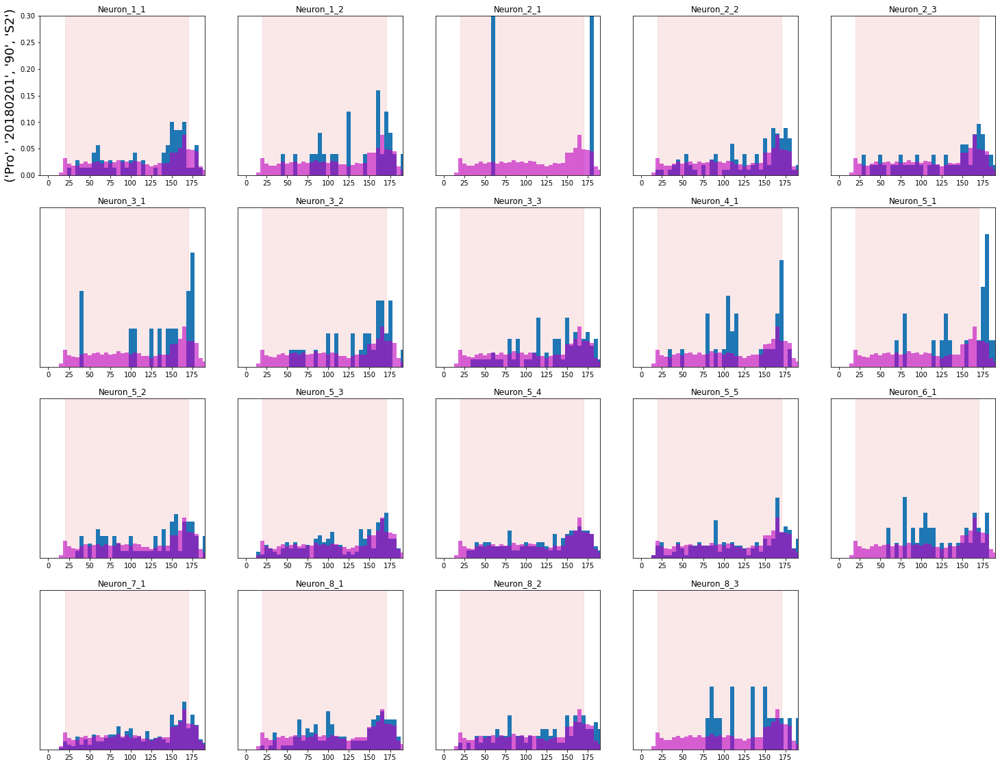

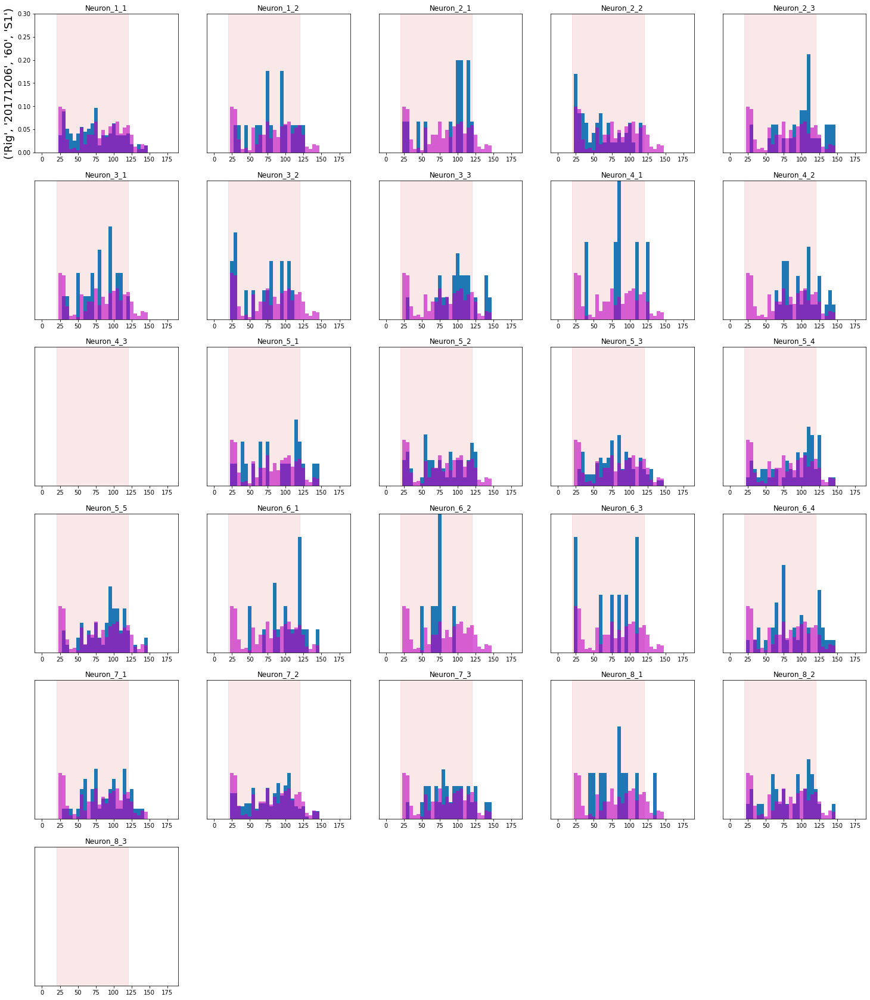

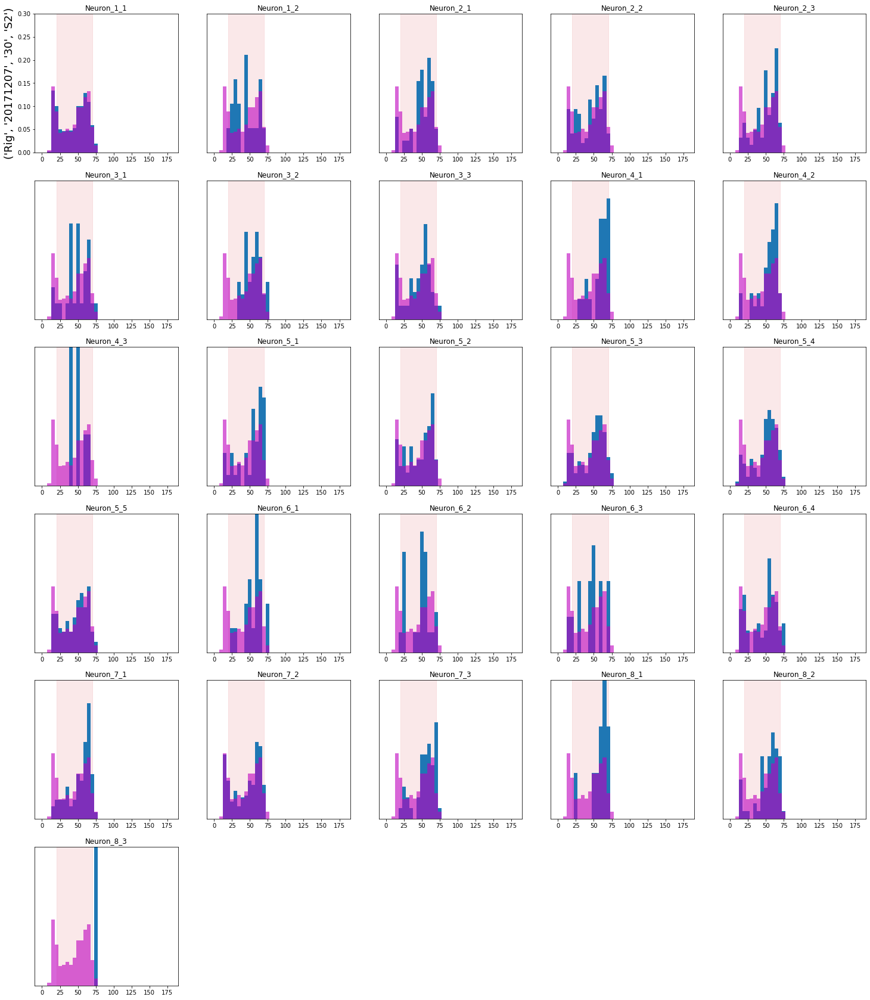

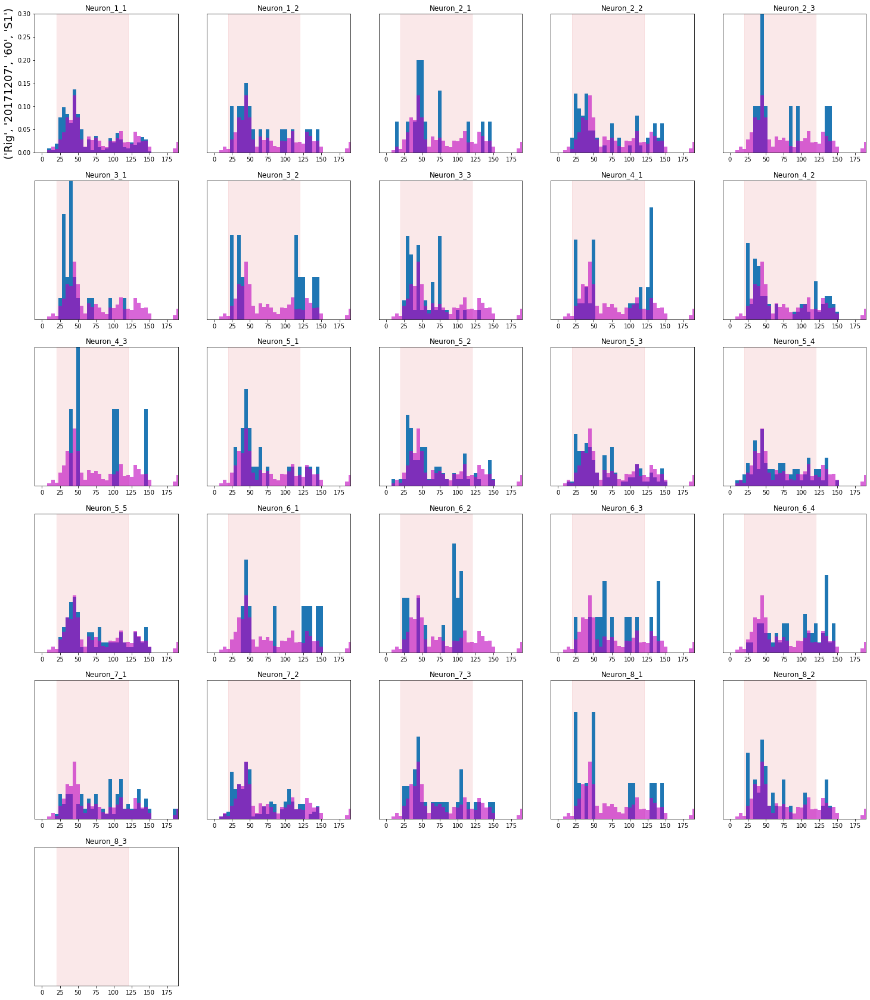

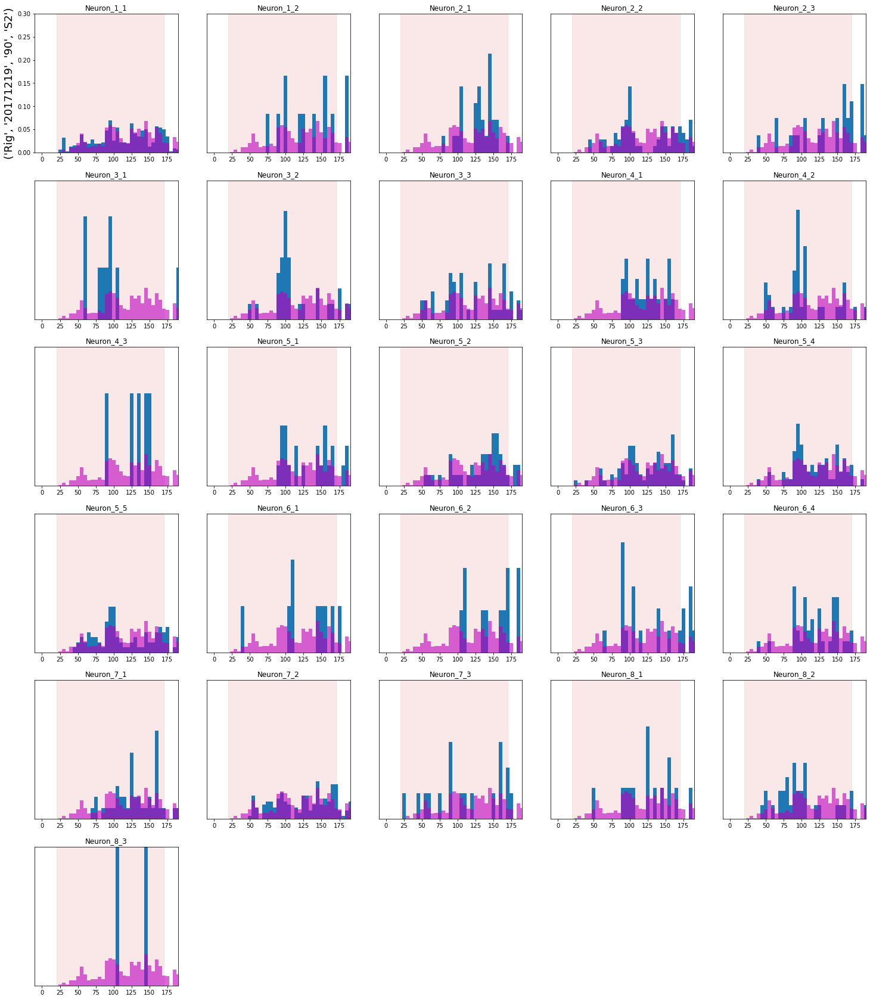

In [23]:
for condition in ('outbound', 'inbound'):
    for session in sessions:
        plt.figure(figsize=(25,30))
        for i, neuron in enumerate(neurons[session]):

            plt.subplot(6,5,i+1)
            if '90' in session:
                plt.fill_between([20, 170], [0, 0], [1000, 1000], color='tab:red', alpha = .1)  
            elif '60' in session:
                plt.fill_between([20, 120], [0, 0], [1000, 1000], color='tab:red', alpha = .1)  
            else:
                plt.fill_between([20, 70], [0, 0], [1000, 1000], color='tab:red', alpha = .1)  
            try:
                dist_response_distribution = dist_field_hist[condition][session][neuron][0]/np.sum(dist_field_hist[condition][session][neuron][0])
                plt.bar(np.linspace(dist_min, dist_max, dist_n_bins), 
                        list(dist_response_distribution), 
                        width=dist_bin_interval) # dist_hist[session][0]
                distance_distribution = dist_hist[condition][session][0]/np.sum(dist_hist[condition][session][0])
                plt.bar(np.linspace(dist_min, dist_max, dist_n_bins), 
                        list(distance_distribution), color='m', width=dist_bin_interval, alpha=.6)
            except:
                pass
            plt.title(neuron)
            plt.ylim(0,.3)
            if i ==0:
                plt.ylabel(session, fontsize=18)
            else:
                plt.yticks([])
            plt.xlim(-10,190)

In [110]:
absolute_difference_field = {}
normalized_difference_field = {}
firing_rate_field = {}
normalized_receptive_field = {}

for condition in ('outbound', 'inbound'):
    
    for session in sessions:
        #plt.figure(figsize=(25,30))
        for i, neuron in enumerate(neurons[session]):

            try:
                index_list = list(session)
                index_list.insert(1, condition)
                index_list.append(neuron)
                index_key = tuple(index_list)

                neuron_response_histogram = np.array(dist_field_hist[condition][session][neuron][0])
                neuron_response_distribution = neuron_response_histogram / np.sum(neuron_response_histogram)
                raw_firing_rate = np.sum(neuron_response_histogram) / delta_t * 1000 / 25

                path_histogram = np.array(dist_hist[condition][session][0])
                path_distribution = path_histogram / np.sum(path_histogram)

                normalized_difference_field[index_key] = neuron_response_distribution - path_distribution        
                absolute_difference_field[index_key] = (neuron_response_distribution - path_distribution) * raw_firing_rate   
                firing_rate_field[index_key] = np.ones(dist_n_bins) * raw_firing_rate 
                #print(raw_firing_rate)
                normalized_receptive_field[index_key] = np.zeros(dist_n_bins)
                i_dist = np.where(path_histogram > 2)
                firing_rate_field[index_key][i_dist] = neuron_response_histogram[i_dist] / (path_histogram[i_dist] * 1/25) # each bin is 1/25 sec
                normalized_receptive_field[index_key] = firing_rate_field[index_key] / np.sum(firing_rate_field[index_key]) # each bin is 1/25 sec
                #plt.bar(np.linspace(dist_min, dist_max, dist_n_bins), 
                #        list(absolute_difference_field[index_key] ), width=dist_bin_interval) # dist_hist[session][0]
            except:
                pass
            #plt.subplot(6,5,i+1)
            #plt.title(f'{condition}-{index_key[3]}-{index_key[2]}-{neuron}')
            #plt.ylim(-50,50)
            #if i ==0:
            #    plt.ylabel(session, fontsize=18)
            #else:
            #    plt.yticks([])
            #plt.xlim(-10,190)

In [111]:
import pandas

def to_pandas(dist_field):   
    dist_field_df = pandas.DataFrame(dist_field)
    session_index = dist_field_df.columns
    session_index.names = ['name', 'condition',  'date', 'dist', 'session', 'neuron']
    dist_index=pandas.Index(np.linspace(dist_min,dist_max,dist_n_bins), name='distance')
    dist_field_df = dist_field_df.set_index(dist_index)
    dist_field_df = dist_field_df.transpose()
    dist_field_df = dist_field_df.set_index(session_index)
    return dist_field_df

absolute_difference_field_df = to_pandas(absolute_difference_field)
normalized_difference_field_df = to_pandas(normalized_difference_field)
firing_rate_field_df = to_pandas(firing_rate_field)
normalized_receptive_field_df = to_pandas(normalized_receptive_field)

normalized_receptive_field_df

distance                                            0.0       5.0       10.0   \
name condition date     dist session neuron                                     
Alt  outbound  20171122 30   S1      Neuron_1_1  0.026817  0.026817  0.026817   
                                     Neuron_2_1  0.029240  0.029240  0.029240   
                                     Neuron_3_1  0.029523  0.029523  0.029523   
                                     Neuron_3_2  0.027238  0.027238  0.027238   
                        60   S1      Neuron_1_1  0.032842  0.032842  0.032842   
...                                                   ...       ...       ...   
Rig  inbound   20171219 90   S2      Neuron_7_2  0.016610  0.016610  0.016610   
                                     Neuron_7_3  0.016135  0.016135  0.016135   
                                     Neuron_8_1  0.022411  0.022411  0.022411   
                                     Neuron_8_2  0.014352  0.014352  0.014352   
                                     Neuron_8_3  0.026261  0.026261  0.026261   

distance                                            15.0      20.0      25.0   \
name condition date     dist session neuron                                     
Alt  outbound  20171122 30   S1      Neuron_1_1  0.026817  0.013302  0.002771   
                                     Neuron_2_1  0.029240  0.000000  0.000000   
                                     Neuron_3_1  0.029523  0.021346  0.028164   
                                     Neuron_3_2  0.027238  0.000000  0.005067   
                        60   S1      Neuron_1_1  0.032842  0.000000  0.000000   
...                                                   ...       ...       ...   
Rig  inbound   20171219 90   S2      Neuron_7_2  0.016610  0.016610  0.016610   
                                     Neuron_7_3  0.016135  0.016135  0.016135   
                                     Neuron_8_1  0.022411  0.022411  0.022411   
                                     Neuron_8_2  0.014352  0.014352  0.014352   
                                     Neuron_8_3  0.026261  0.026261  0.026261   

distance                                            30.0      35.0      40.0   \
name condition date     dist session neuron                                     
Alt  outbound  20171122 30   S1      Neuron_1_1  0.002583  0.025024  0.007825   
                                     Neuron_2_1  0.053229  0.047497  0.050391   
                                     Neuron_3_1  0.012434  0.032406  0.025112   
                                     Neuron_3_2  0.004722  0.007224  0.042916   
                        60   S1      Neuron_1_1  0.000000  0.004462  0.010564   
...                                                   ...       ...       ...   
Rig  inbound   20171219 90   S2      Neuron_7_2  0.000000  0.016610  0.000000   
                                     Neuron_7_3  0.000000  0.016135  0.000000   
                                     Neuron_8_1  0.000000  0.022411  0.000000   
                                     Neuron_8_2  0.000000  0.014352  0.000000   
                                     Neuron_8_3  0.000000  0.026261  0.000000   

distance                                            45.0   ...     150.0  \
name condition date     dist session neuron                ...             
Alt  outbound  20171122 30   S1      Neuron_1_1  0.018222  ...  0.026817   
                                     Neuron_2_1  0.009388  ...  0.029240   
                                     Neuron_3_1  0.026316  ...  0.029523   
                                     Neuron_3_2  0.029983  ...  0.027238   
                        60   S1      Neuron_1_1  0.010942  ...  0.000000   
...                                                   ...  ...       ...   
Rig  inbound   20171219 90   S2      Neuron_7_2  0.000000  ...  0.018834   
                                     Neuron_7_3  0.120050  ...  0.032321   
                                     Neuron_8_1  0.000000  ...  0.000000   
  

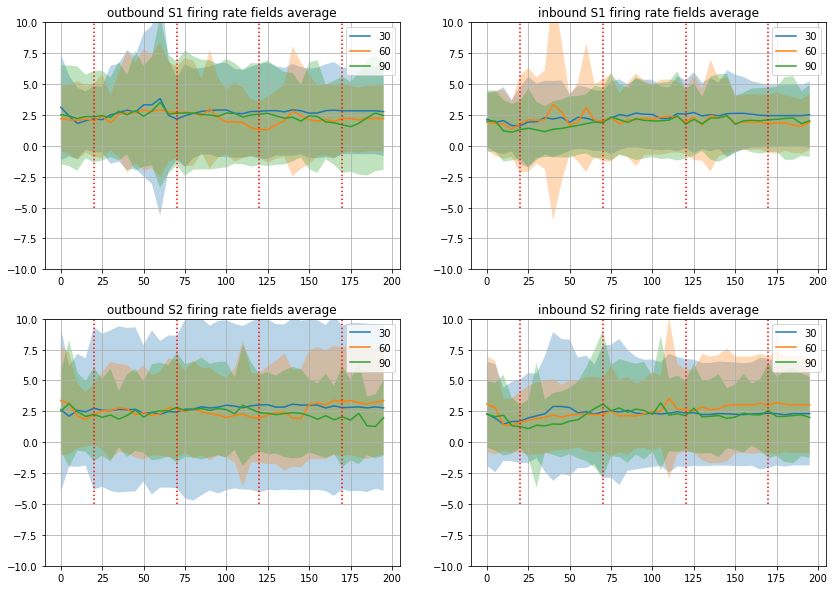

In [143]:
plt.figure(figsize=(14,10))
for i, condition in enumerate(('outbound', 'inbound')):
    for j, session in enumerate(('S1', 'S2')):
        plt.subplot(2,2,j*2+i+1)
        for dist in ('30', '60', '90'):
            data = firing_rate_field_df.xs(condition, level='condition').xs(dist, level='dist').xs(session, level='session').values
            dist_axe = np.linspace(dist_min, dist_max, dist_n_bins)
            plt.plot(dist_axe,data.mean(axis=0), label=dist)
            plt.fill_between(dist_axe, data.mean(axis=0)-data.std(axis=0),data.mean(axis=0)+data.std(axis=0), alpha=.3)

        plt.plot((20,20), (-5, 10), 'r:')
        plt.plot((70,70), (-5, 10), 'r:')
        plt.plot((120,120), (-5, 10), 'r:')
        plt.plot((170,170), (-5, 10), 'r:')     
        plt.grid('on')
        plt.ylim(-10,10)
        plt.legend()
        plt.title(condition + ' ' + session+' firing rate fields average')

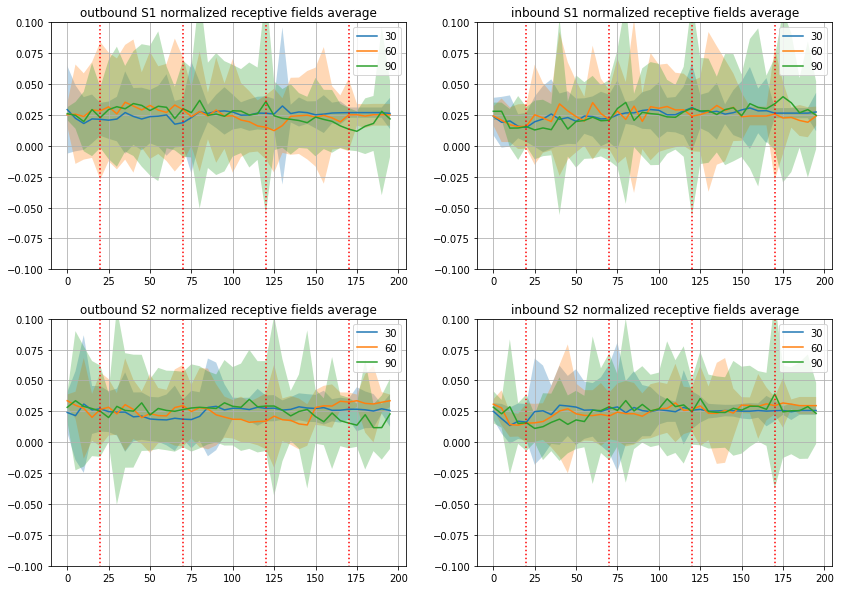

In [142]:
plt.figure(figsize=(14,10))
for i, condition in enumerate(('outbound', 'inbound')):
    for j, session in enumerate(('S1', 'S2')):
        plt.subplot(2,2,j*2+i+1)
        for dist in ('30', '60', '90'):
            data = normalized_receptive_field_df.xs(condition, level='condition').xs(dist, level='dist').xs(session, level='session').values
            dist_axe = np.linspace(dist_min, dist_max, dist_n_bins)
            plt.plot(dist_axe,data.mean(axis=0), label=dist)
            plt.fill_between(dist_axe, data.mean(axis=0)-data.std(axis=0),data.mean(axis=0)+data.std(axis=0), alpha=.3)

        plt.plot((20,20), (-5, 10), 'r:')
        plt.plot((70,70), (-5, 10), 'r:')
        plt.plot((120,120), (-5, 10), 'r:')
        plt.plot((170,170), (-5, 10), 'r:')     
        plt.grid('on')
        plt.ylim(-.1,.1)
        plt.legend()
        plt.title(condition + ' ' +session+' normalized receptive fields average')

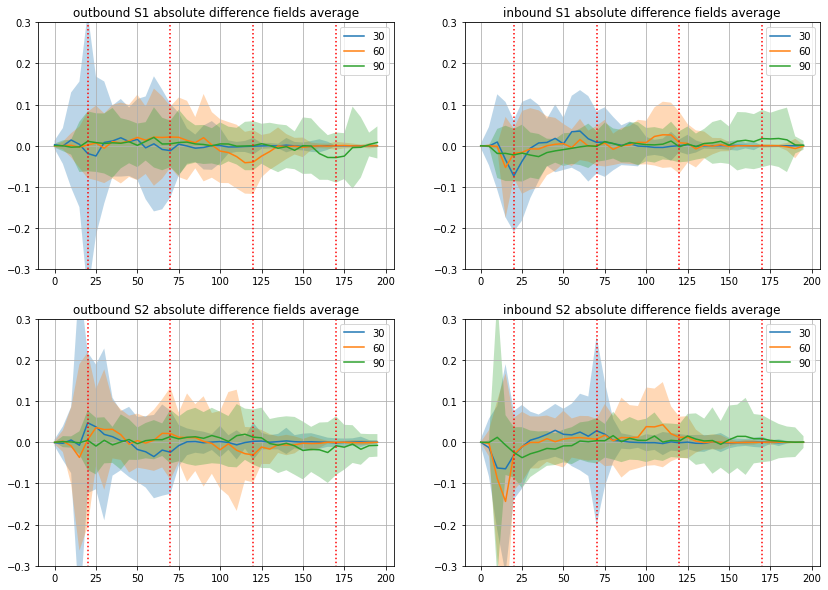

In [141]:
plt.figure(figsize=(14,10))
for i, condition in enumerate(('outbound', 'inbound')):
    for j, session in enumerate(('S1', 'S2')):
        plt.subplot(2,2,j*2+i+1)
        for dist in ('30', '60', '90'):
            data = absolute_difference_field_df.xs(condition, level='condition').xs(dist, level='dist').xs(session, level='session').values
            dist_axe = np.linspace(dist_min, dist_max, dist_n_bins)
            plt.plot(dist_axe,data.mean(axis=0), label=dist)
            plt.fill_between(dist_axe, data.mean(axis=0)-data.std(axis=0),data.mean(axis=0)+data.std(axis=0), alpha=.3)

        plt.plot((20,20), (-5, 10), 'r:')
        plt.plot((70,70), (-5, 10), 'r:')
        plt.plot((120,120), (-5, 10), 'r:')
        plt.plot((170,170), (-5, 10), 'r:')     
        plt.grid('on')
        plt.ylim(-.3,.3)
        plt.legend()
        plt.title(condition + ' ' +session+' absolute difference fields average')

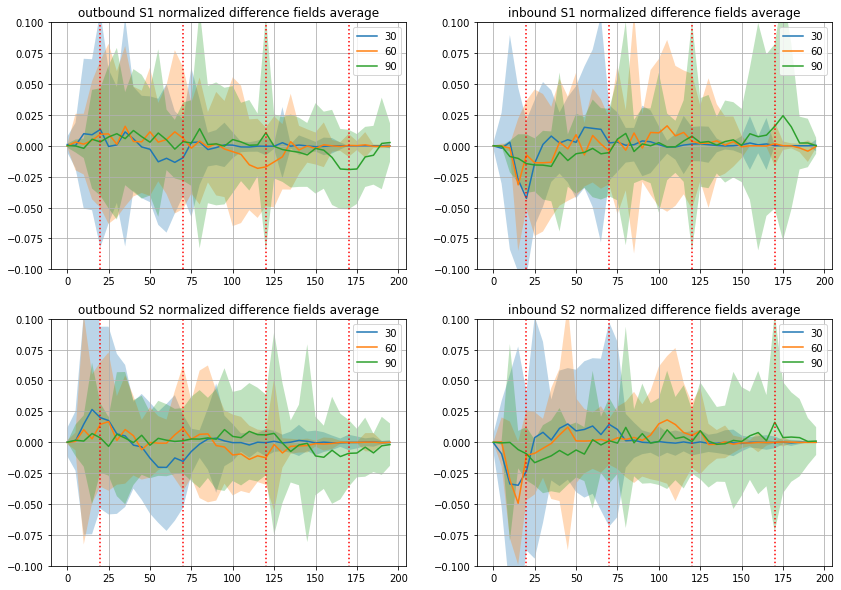

In [140]:
plt.figure(figsize=(14,10))
for i, condition in enumerate(('outbound', 'inbound')):
    for j, session in enumerate(('S1', 'S2')):
        plt.subplot(2,2,j*2+i+1)
        for dist in ('30', '60', '90'):
            data = normalized_difference_field_df.xs(condition, level='condition').xs(dist, level='dist').xs(session, level='session').values
            dist_axe = np.linspace(dist_min, dist_max, dist_n_bins)
            plt.plot(dist_axe,data.mean(axis=0), label=dist)
            plt.fill_between(dist_axe, data.mean(axis=0)-data.std(axis=0),data.mean(axis=0)+data.std(axis=0), alpha=.3)

        plt.plot((20,20), (-5, 10), 'r:')
        plt.plot((70,70), (-5, 10), 'r:')
        plt.plot((120,120), (-5, 10), 'r:')
        plt.plot((170,170), (-5, 10), 'r:')     
        plt.grid('on')
        plt.ylim(-.1,.1)
        plt.legend()
        plt.title(condition + ' ' +session+' normalized difference fields average')

In [19]:
absolute_difference_field_df.to_pickle('absolute_difference_field_df.pkl')
normalized_difference_field_df.to_pickle('normalized_difference_field_df.pkl')
firing_rate_field_df.to_pickle('firing_rate_field_df.pkl')
normalized_receptive_field_df.to_pickle('normalized_receptive_field_df.pkl')

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


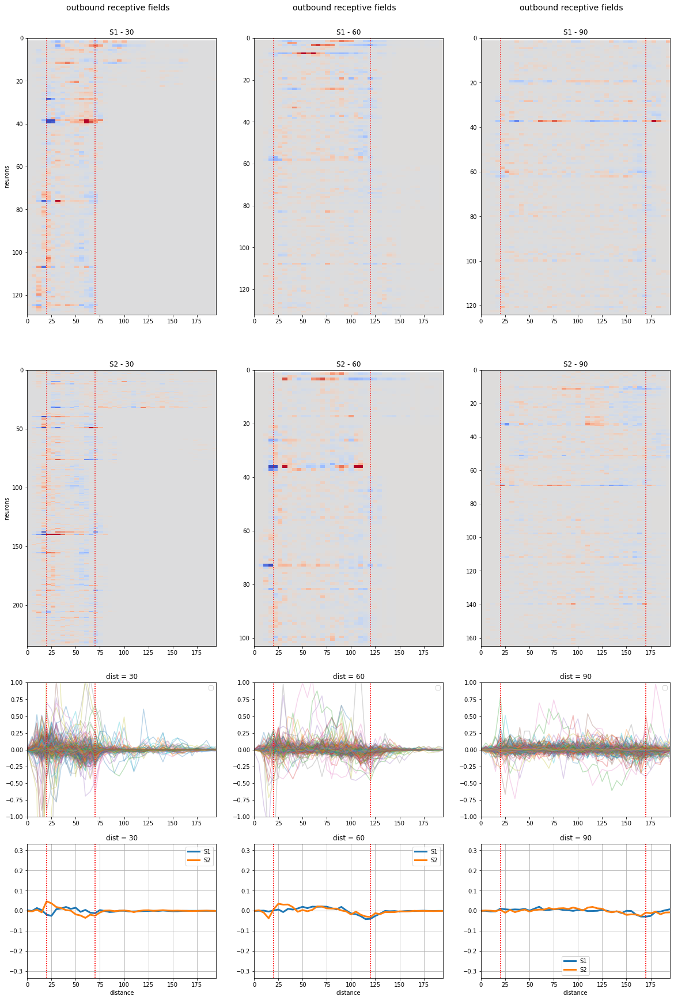

In [120]:
plt.figure(figsize=(20,30))
color = {'S1':'tab:blue', 'S2':'tab:orange'}
for j, session in enumerate(['S1', 'S2']):
    
    for i, dist in enumerate(['30','60','90']):
        
        
        dist_field_map = absolute_difference_field_df.xs(condition, level='condition').xs(dist, level='dist').xs(session, level='session').values
        vmin, vmax = -1, 1
        #dist_field_map = FR_dist_field_df.xs(dist, level='dist').xs(session, level='session').values
        #vmin, vmax = 0, 50
        #dist_field_map = norm_relative_dist_field_df.xs(dist, level='dist').xs(session, level='session').values
        #dist_field_map = norm_FR_dist_field_df.xs(dist, level='dist').xs(session, level='session').values
        #vmin, vmax = -.3, .3
        
        n_samples, n_bins = dist_field_map.shape
        
        plt.subplot(3, 3, i + 1 + j*3)
        plt.imshow(dist_field_map, aspect='auto', extent=(dist_min,dist_max, n_samples, 1), 
                   vmin=vmin, vmax=vmax, 
           cmap='coolwarm', interpolation ='nearest')
        plt.title(session + ' - ' + dist)
        plt.plot((20,20), (0,n_samples), 'r:')
        if dist == '30':
            plt.plot((70,70), (0,n_samples), 'r:')
        elif dist == '60':
            plt.plot((120,120), (0,n_samples), 'r:')
        else:
            plt.plot((170,170), (0,n_samples), 'r:')
        plt.ylim(0,n_samples)
        if j==0:
            plt.text(40, -0.1*n_samples, condition + ' receptive fields', fontsize=14)
        plt.gca().invert_yaxis()
        if i==0:
            plt.ylabel('neurons')
        
        plt.subplot(6, 3, i + 13)
        for s in range(n_samples):
            
            plt.plot(np.linspace(dist_min, dist_max, dist_n_bins), 
                 #np.mean(norm_relative_dist_field_map * np.array(norm_relative_dist_field_map>0, dtype='int'), axis=0),
                 dist_field_map[s,:],
                 alpha=.3)
                
        plt.plot((20,20), (-50, 50), 'r:')
        if dist == '30':
            plt.plot((70,70), (-50, 50), 'r:')
        elif dist == '60':
            plt.plot((120,120), (-50, 50), 'r:')
        else:
            plt.plot((170,170), (-50, 50), 'r:')        
        plt.ylim(vmin,vmax)
        plt.xlim(dist_min, dist_max)
        plt.title('dist = '+dist)
        if j==1:
            plt.legend()
        
            
        plt.subplot(6, 3, i + 16)
        plt.plot(np.linspace(dist_min, dist_max, dist_n_bins), 
                 np.mean(dist_field_map , axis=0),
                 label = session, lw=3)
        
        plt.ylim(vmin/3,vmax/3)
        plt.plot((20,20), (-8, 8), 'r:')
        if dist == '30':
            plt.plot((70,70), (-8, 8), 'r:')
        elif dist == '60':
            plt.plot((120,120), (-8, 8), 'r:')
        else:
            plt.plot((170,170), (-8, 8), 'r:')     
        plt.xlim(dist_min, dist_max)
        plt.title('dist = '+dist)
        if j==1:
            plt.legend()
        plt.xlabel('distance')
        plt.grid('on')
        

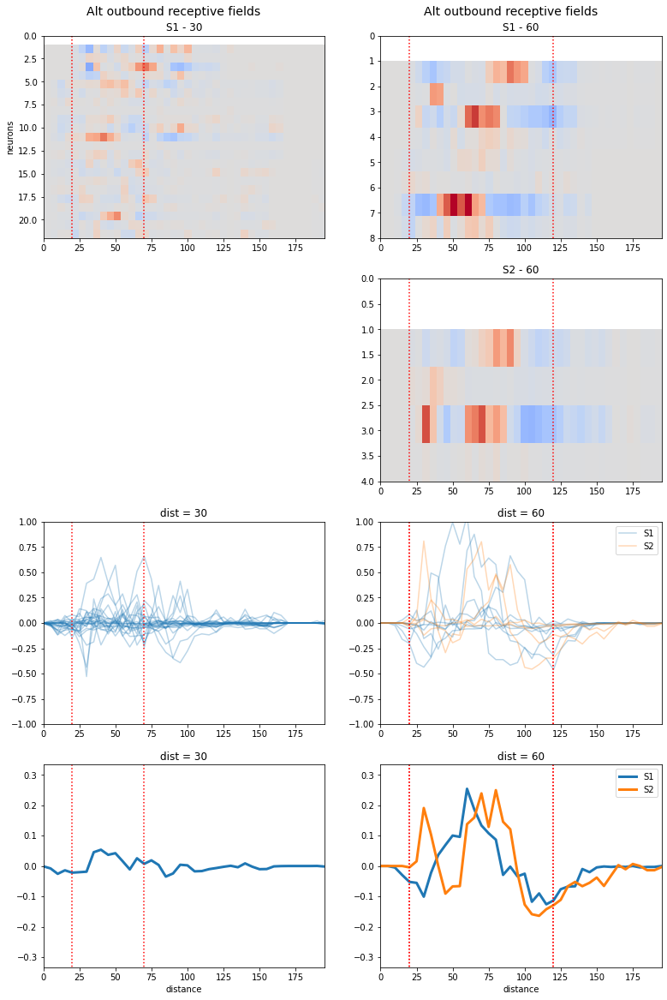

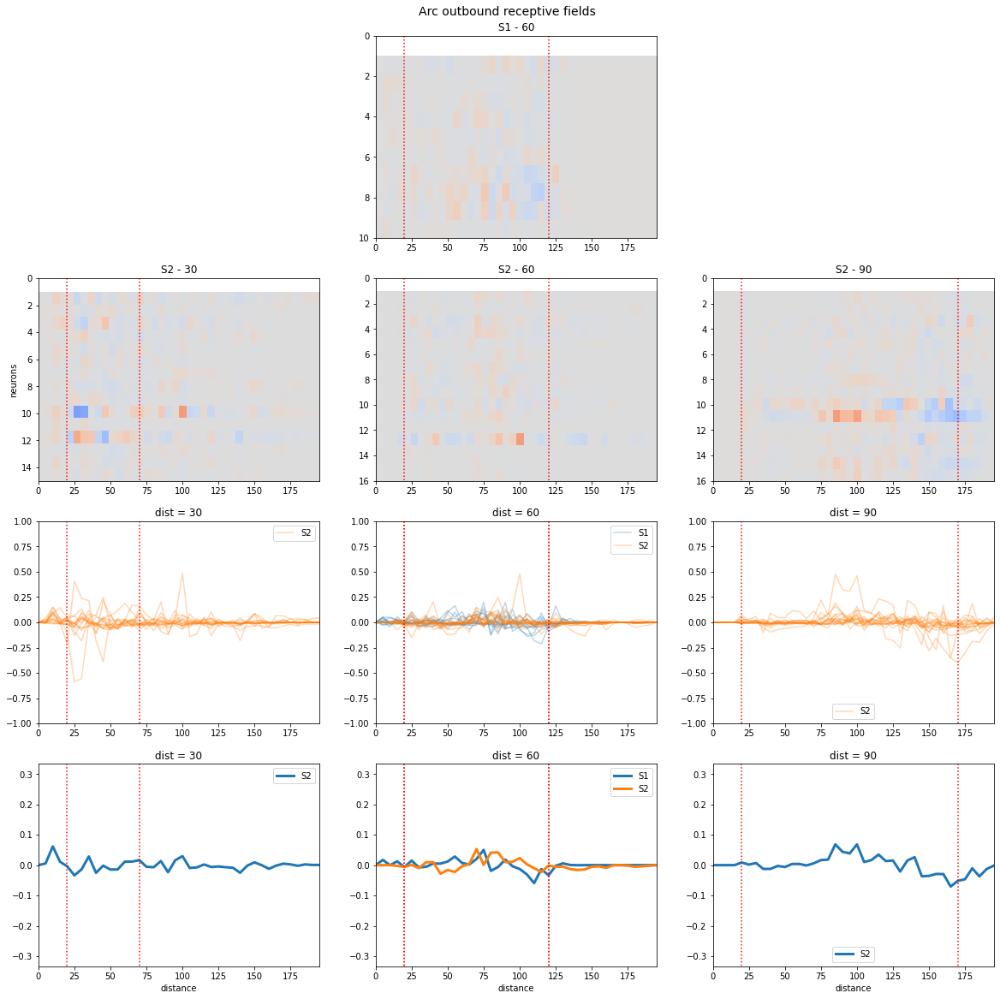

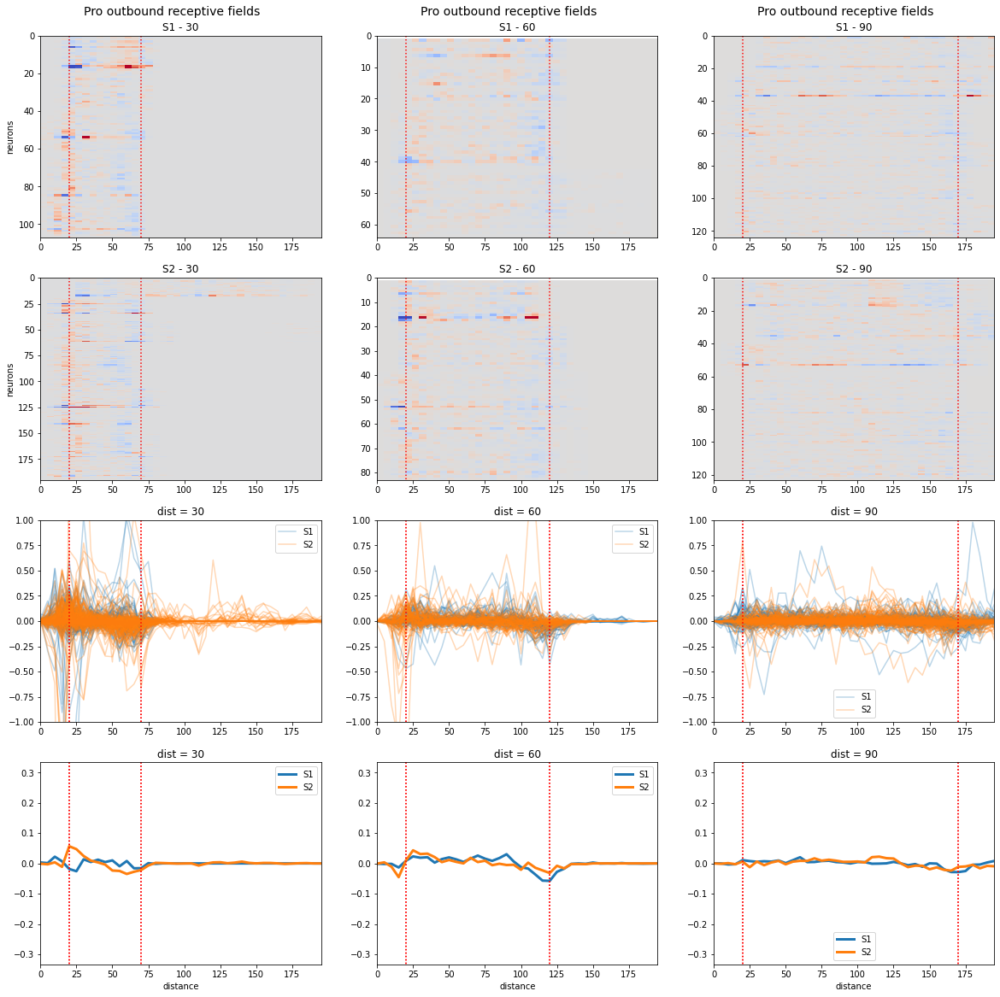

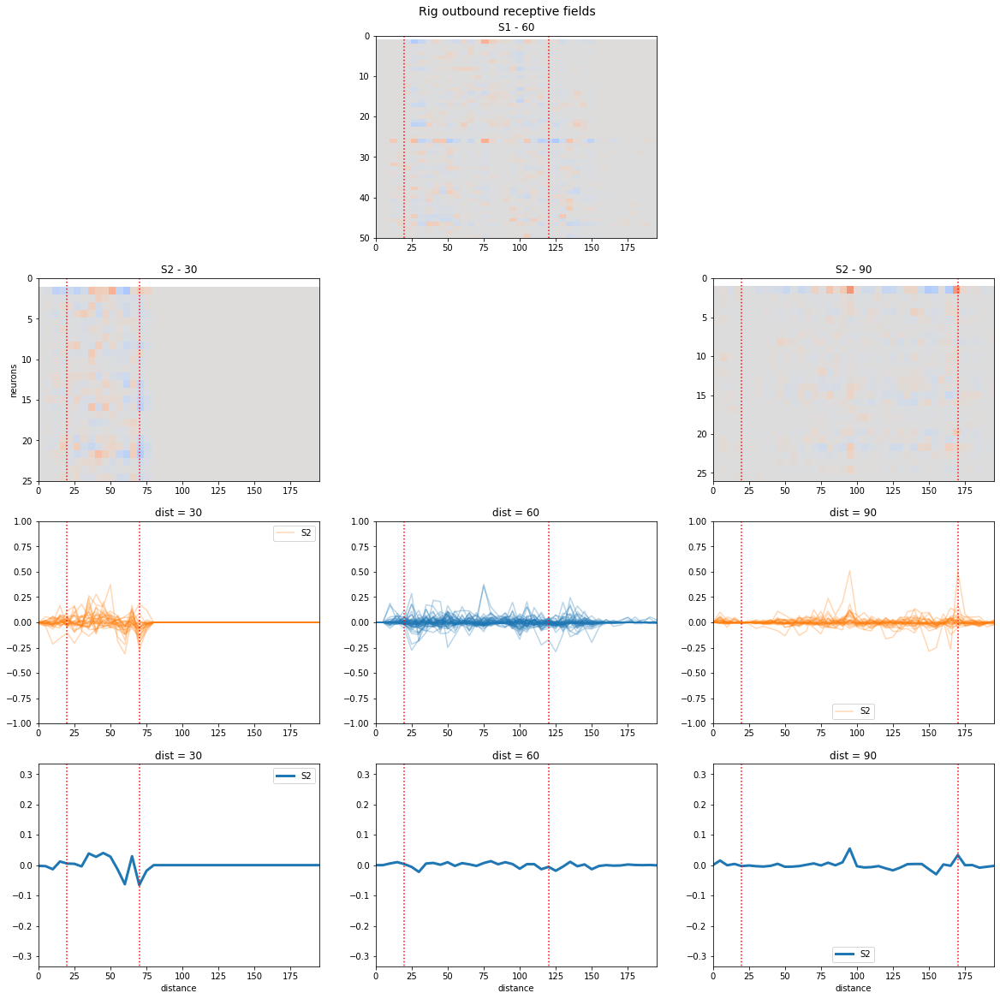

In [121]:
for name in ('Alt', 'Arc', 'Pro', 'Rig'):
    plt.figure(figsize=(20,20))
    color = {'S1':'tab:blue', 'S2':'tab:orange'}
    for j, session in enumerate(['S1', 'S2']):

        for i, dist in enumerate(['30','60','90']):
            try:

                #relative_dist_field_map = relative_dist_field_df.xs(dist, level='dist').xs(session, level='session').values
                dist_field_map = absolute_difference_field_df.xs(condition, level='condition').xs(name, level='name').xs(dist, level='dist').xs(session, level='session').values
                vmin, vmax = -1, 1
                
                n_samples, n_bins = dist_field_map.shape

                plt.subplot(4, 3, i + 1 + j*3)
                plt.imshow(dist_field_map, aspect='auto', extent=(dist_min,dist_max, n_samples, 1), 
                           vmin=vmin, vmax=vmax, 
                   cmap='coolwarm', interpolation ='nearest')
                plt.title(session + ' - ' + dist)
                plt.plot((20,20), (0,n_samples), 'r:')
                if dist == '30':
                    plt.plot((70,70), (0,n_samples), 'r:')
                elif dist == '60':
                    plt.plot((120,120), (0,n_samples), 'r:')
                else:
                    plt.plot((170,170), (0,n_samples), 'r:')
                plt.ylim(0,n_samples)
                if j==0:
                    plt.text(30, -0.1*n_samples, name + ' ' + condition + ' receptive fields', fontsize=14)
                plt.gca().invert_yaxis()
                if i==0:
                    plt.ylabel('neurons')

                plt.subplot(4, 3, i + 7)
                for s in range(n_samples):
                    if s==0:
                        plt.plot(np.linspace(dist_min, dist_max, dist_n_bins), 
                             #np.mean(norm_relative_dist_field_map * np.array(norm_relative_dist_field_map>0, dtype='int'), axis=0),
                             dist_field_map[s,:],
                             alpha=.3, color=color[session], label=session)
                    else:
                        plt.plot(np.linspace(dist_min, dist_max, dist_n_bins), 
                             #np.mean(norm_relative_dist_field_map * np.array(norm_relative_dist_field_map>0, dtype='int'), axis=0),
                             dist_field_map[s,:],
                             alpha=.3, color=color[session])

                plt.plot((20,20), (vmin, vmax), 'r:')
                if dist == '30':
                    plt.plot((70,70), (vmin, vmax), 'r:')
                elif dist == '60':
                    plt.plot((120,120), (vmin, vmax), 'r:')
                else:
                    plt.plot((170,170), (vmin, vmax), 'r:')        
                plt.ylim(vmin,vmax)
                plt.xlim(dist_min, dist_max)
                plt.title('dist = '+dist)
                if j==1:
                    plt.legend()


                plt.subplot(4, 3, i + 10)
                plt.plot(np.linspace(dist_min, dist_max, dist_n_bins), 
                         #np.mean(norm_relative_dist_field_map * np.array(norm_relative_dist_field_map>0, dtype='int'), axis=0),
                         np.mean(dist_field_map , axis=0),
                         label = session, lw=3)

                plt.ylim(-8,8)
                plt.plot((20,20), (-8, 8), 'r:')
                if dist == '30':
                    plt.plot((70,70), (-8, 8), 'r:')
                elif dist == '60':
                    plt.plot((120,120), (-8, 8), 'r:')
                else:
                    plt.plot((170,170), (-8, 8), 'r:')     
                plt.ylim(vmin/3,vmax/3)
                plt.xlim(dist_min, dist_max)
                plt.title('dist = '+dist)
                if j==1:
                    plt.legend()
                plt.xlabel('distance')
            except:
                pass
        

In [ ]:
# S1 = avec plateforme
# S2 = sans plateforme
# regarder les premiers trials ("calibration")
# relation linéaire entre theta frequency et vitesse / accélération
# pb de time "top depart" --> on mesure le temps negativement a partir du temps de demi tour
# pb de la distance estimee vs distance reelle : on peut penser que le moment du demi tour est celui ou l'animal estime la distance "cible"

In [ ]:
# speed x theta slope varie en fonction de la tache (30, 60, 90) ==> indice de difficulté, "engagement" 
# IMPORTANT : identifier le profil de la theta frequency au cours d'une trajectoire??? temps trop court

In [ ]:
# tolerance : target +/- 5 cm
# vitesse plus faible à 30 cm, plateau à 60 - 90 cm

In [ ]:
# theta (4-12) / gamma (25 -50 | 50-90) = nested? 

In [ ]:
# idee : recrutement de plus de cellules à l'aller? (plus de cellules sont impliques dans l'estimation de la distance)
# idee : extinction active au retour?

In [ ]:
# but = "lieu" / celules de "but"?